# Prediction of Burned Calories

## Project Description:

This project aims to develop an artificial intelligence model capable of automatically predicting the number of calories burned during physical activity.
The goal is to provide a reliable estimate of energy expenditure based on physiological data and exercise parameters, helping with sports monitoring and training program optimization.

## Objective:

Build a high-performance regression model to accurately estimate the amount of calories burned.
The aim is to generate personalized predictions based on individual characteristics and measurements recorded during the activity.

## Type of Data:

The project uses tabular data including:

* Age, gender, height, and weight of the individual
* Exercise duration
* Average heart rate during the activity
* Body temperature
* Number of calories burned (continuous target variable)

## Business Context:

Evaluating energy expenditure is essential for athletes, coaches, fitness applications, and anyone seeking to track physical activity or manage body weight.
Traditional calculations are often approximate and poorly personalized.
Automating this process through AI enables more accurate estimates tailored to each user’s profile, improving performance monitoring, weight management, and engagement in a training program.

## Final Objective:

* **Problem type:** Regression (predicting a continuous value: calories burned)
* **Evaluation:** Use of regression metrics such as RMSE, MAE, and R²
* **Deliverable:** A predictive model that can be integrated into a fitness application, a sports coaching tool, or a personalized energy-tracking dashboard.


### **1. Data Collection and Loading**

* Importing the calorie and exercise datasets (e.g., CSV files or database).
* Checking the columns and variable types.
* Quick preview of the first rows to understand the data structure.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msn
import plotly.express as px

In [6]:
# Load the dataset
df_calories = pd.read_csv('calories.csv')

# Display basic information
print(f"Dimensions: {df_calories.shape[0]} rows × {df_calories.shape[1]} columns")
print(f"Memory usage: {df_calories.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
print("\n" + "="*80 + "\n")

# Preview of the data
display(df_calories.head())
print("\n" + "="*80 + "\n")

# Column information
df_calories.info()


Dimensions: 15000 rows × 2 columns
Memory usage: 0.23 MB




,User_ID,Calories
0,14733363,231.0
1,14861698,66.0
2,11179863,26.0
3,16180408,71.0
4,17771927,35.0




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   User_ID   15000 non-null  int64  
 1   Calories  15000 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 234.5 KB


In [8]:
# load the dataset
df_exercices = pd.read_csv('exercise.csv')

# Display basic information
print(f"Dimensions: {df_exercices.shape[0]} rows × {df_exercices.shape[1]} columns")
print(f"Memory usage: {df_exercices.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
print("\n" + "="*80 + "\n")

# Preview of the dataset
display(df_exercices.head())
print("\n" + "="*80 + "\n")

# Column information
df_exercices.info()


Dimensions: 15000 rows × 8 columns
Memory usage: 1.57 MB




,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User_ID     15000 non-null  int64  
 1   Gender      15000 non-null  object 
 2   Age         15000 non-null  int64  
 3   Height      15000 non-null  float64
 4   Weight      15000 non-null  float64
 5   Duration    15000 non-null  float64
 6   Heart_Rate  15000 non-null  float64
 7   Body_Temp   15000 non-null  float64
dtypes: float64(5), int64(2), object(1)
memory usage: 937.6+ KB


In [9]:
df = df_exercices.join(df_calories.set_index('User_ID'), on='User_ID')
df.head()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8,231.0
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3,66.0
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7,26.0
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5,71.0
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8,35.0


In [10]:
df.shape

(15000, 9)

C:\Users\ins expertise\AppData\Local\Temp\ipykernel_27288\2477175069.py:5: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 1400x800 with 0 Axes>

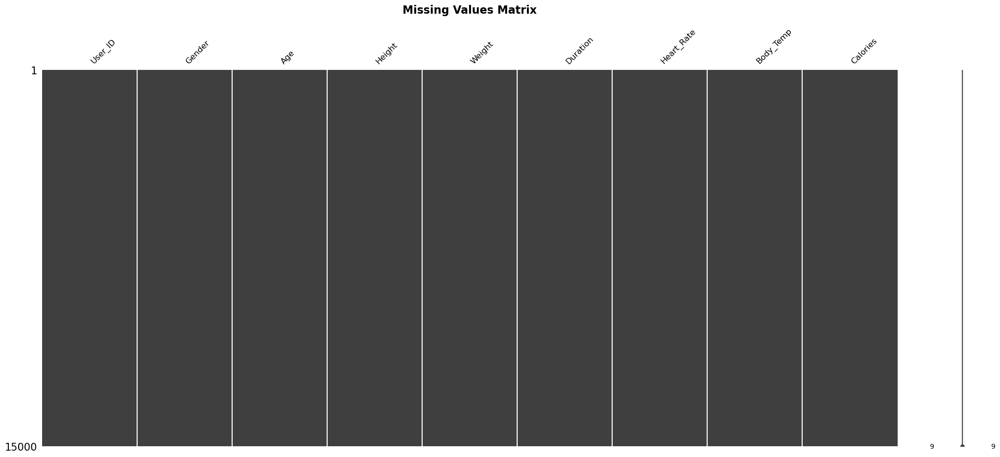


📊 Missing Values Statistics:



,Missing_Count,Missing_Percentage


In [11]:
# Visualization matrix of missing values
plt.figure(figsize=(14, 8))
msn.matrix(df, fontsize=12, sparkline=True)
plt.title("Missing Values Matrix", fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Missing values statistics
missing_stats = pd.DataFrame({
    'Missing_Count': df.isnull().sum(),
    'Missing_Percentage': (df.isnull().sum() / len(df) * 100).round(2)
}).sort_values('Missing_Percentage', ascending=False)

print("\n📊 Missing Values Statistics:\n")
display(missing_stats[missing_stats['Missing_Count'] > 0])


No values are missing in the dataset. Each column shows a zero count of missing entries, confirming that the data is complete and that no imputation is required for any attribute. This completeness is essential to ensure the reliability and thoroughness of the dataset for future analyses.

In [7]:
df.describe()

,User_ID,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
count,1.500000e+04,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,1.497736e+07,42.789800,174.465133,74.966867,15.530600,95.518533,40.025453,89.539533
std,2.872851e+06,16.980264,14.258114,15.035657,8.319203,9.583328,0.779230,62.456978
min,1.000116e+07,20.000000,123.000000,36.000000,1.000000,67.000000,37.100000,1.000000
25%,1.247419e+07,28.000000,164.000000,63.000000,8.000000,88.000000,39.600000,35.000000
50%,1.499728e+07,39.000000,175.000000,74.000000,16.000000,96.000000,40.200000,79.000000
75%,1.744928e+07,56.000000,185.000000,87.000000,23.000000,103.000000,40.600000,138.000000
max,1.999965e+07,79.000000,222.000000,132.000000,30.000000,128.000000,41.500000,314.000000


There are no outlier values such as negative ages, weights, or heights.


In [12]:
df.duplicated().sum()

0

The dataset contains no duplicate values. This absence of duplicates is essential to preserve the integrity and reliability of the dataset, ensuring that each record is unique and preventing any potential distortion in subsequent analyses.

In [13]:
df['Gender'].value_counts().sum

<bound method Series.sum of Gender
female    7553
male      7447
Name: count, dtype: int64>

# 2. Exploratory Data Analysis (EDA)

- Study of the distribution of numerical variables (age, height, weight, duration, heart rate, body temperature).  
- Analysis of the target variable: distribution of calories burned.  
- Visualization of differences between profiles (e.g., male vs female, variation of calories according to age or heart rate).  
- Identification of potential anomalies or extreme values (outliers) in physiological measurements or exercise data.  
- Analysis of correlations between different variables and with the target variable (calories burned) to identify the most influential factors.


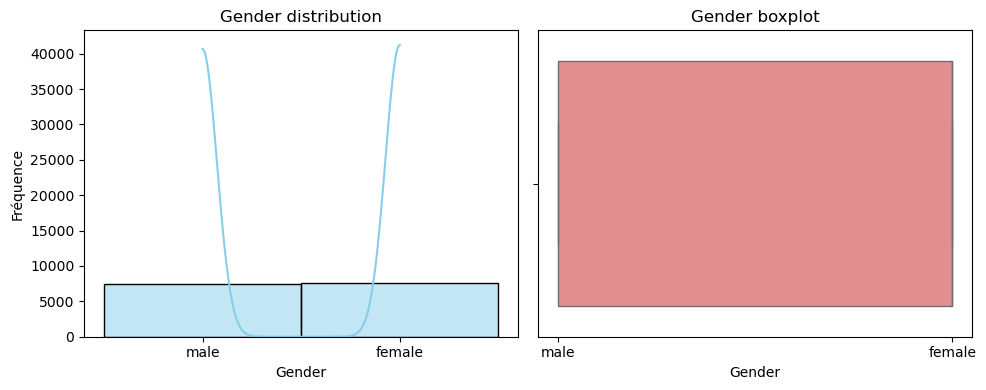

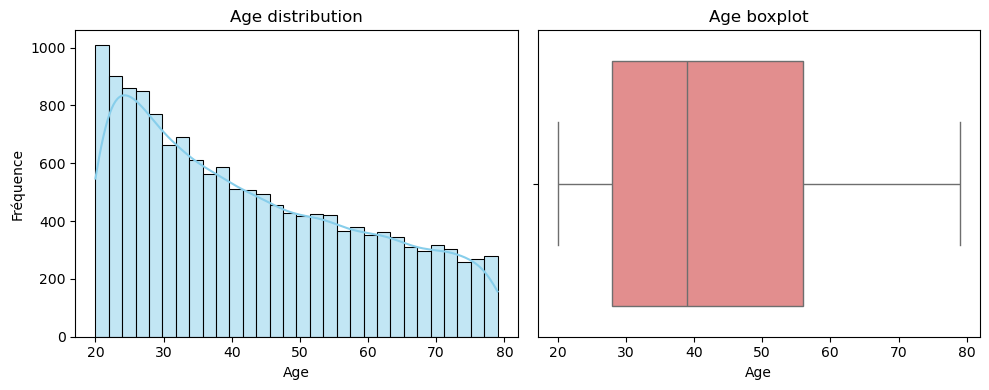

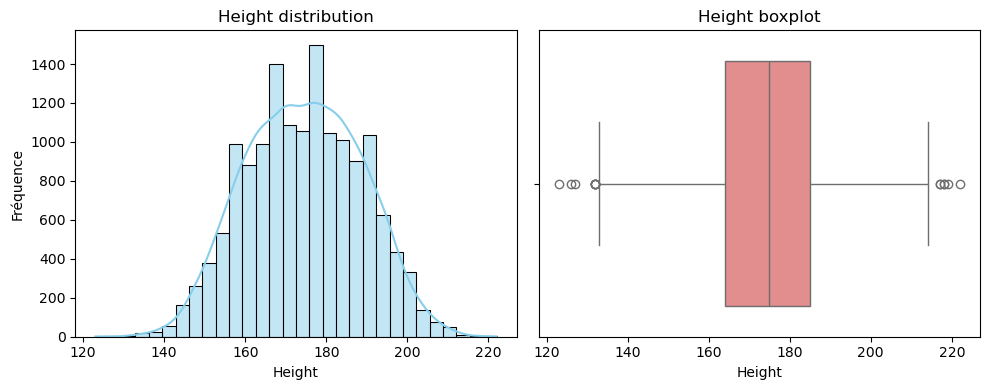

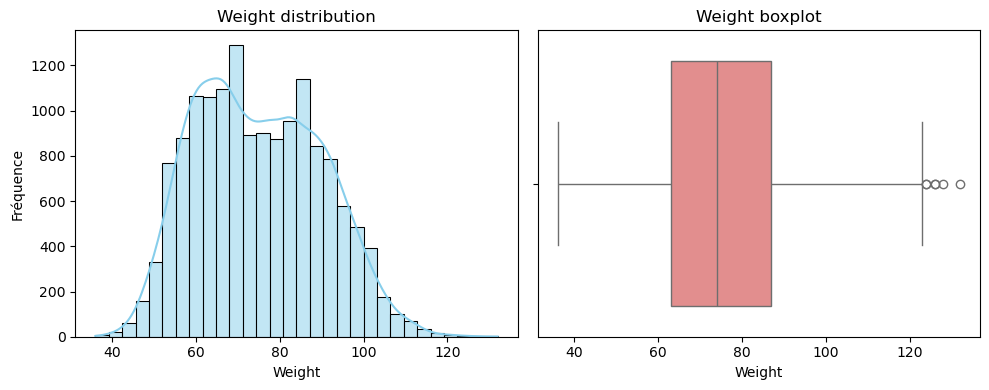

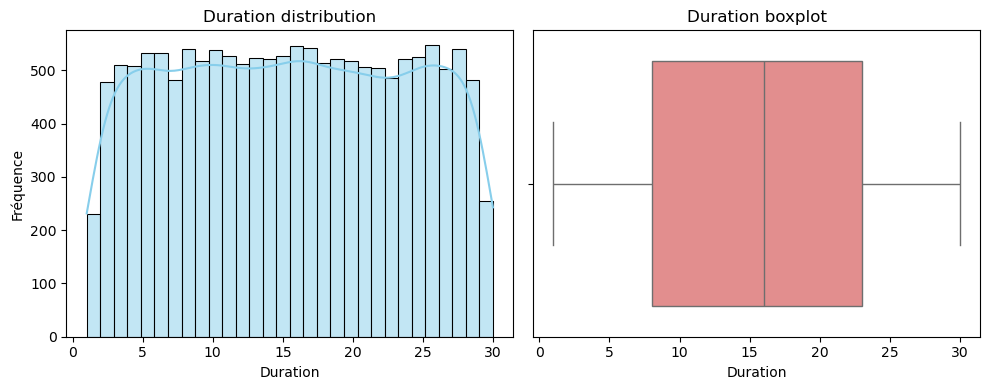

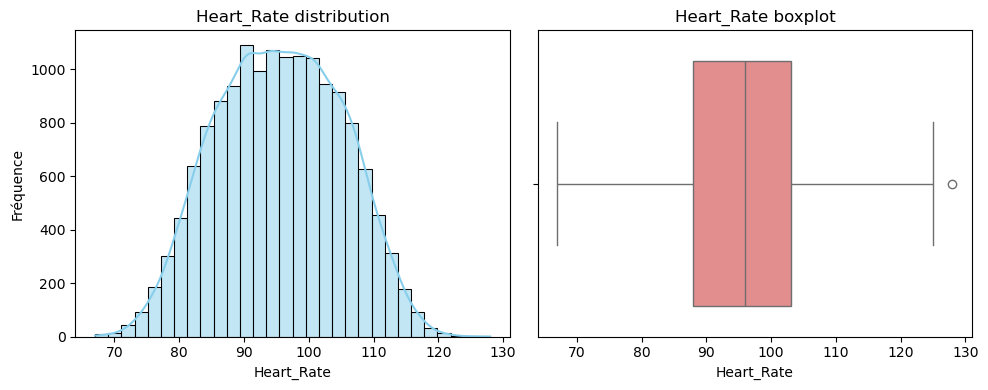

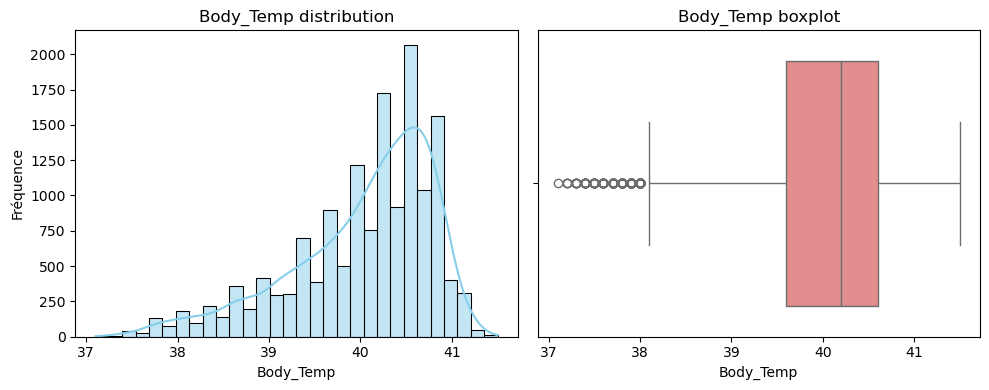

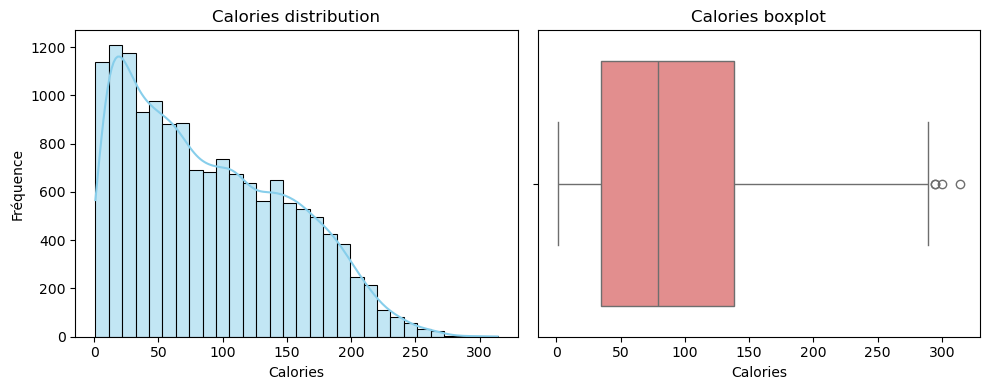

In [14]:
cols = ['Gender', 'Age', 'Height', 'Weight', 'Duration', 'Heart_Rate', 'Body_Temp', 'Calories']



for col in cols:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    # Histogram + KDE
    sns.histplot(df[col], bins=30, kde=True, color='skyblue', ax=axes[0])
    axes[0].set_title(f"{col} distribution")
    axes[0].set_xlabel(col)
    axes[0].set_ylabel("Fréquence")
    
    # Boxplot
    sns.boxplot(x=df[col], color='lightcoral', ax=axes[1])
    axes[1].set_title(f"{col} boxplot")
    
    plt.tight_layout()
    plt.show()

### **Gender**

* Distribution: The dataset is fairly balanced between males and females, with a slight predominance of males.
* Boxplot: Not very informative here, as it is a categorical variable with only two categories.


### **Age**

* Distribution: Most individuals are between 20 and 60 years old, with a decreasing number as age increases (declining distribution, not uniform).
* Boxplot: Shows a median around 40 years, with values up to 80. No notable extreme values.


### **Height**

* Distribution: Height follows a roughly normal distribution centered around 165–175 cm, which is biologically consistent.
* Boxplot: Some outliers below 140 cm and above 210 cm, which may represent special cases (very short or very tall individuals).


### **Weight**

* Distribution: Broad distribution between 40 and 130 kg, with a peak around 70–80 kg.
* Boxplot: Some outliers above 120 kg (high weights). Most values are concentrated between 60 and 90 kg.


### **Duration (exercise duration)**

* Distribution: Duration is fairly evenly distributed between 0 and 30 minutes, indicating good variability in activity lengths.
* Boxplot: No outliers; values are well distributed between 5 and 25 minutes.


### **Heart_Rate**

* Distribution: Bell-shaped distribution centered around 90–110 bpm, which is physiologically plausible.
* Boxplot: Some outliers above 120 bpm (high heart rates).


### **Body_Temp**

* Distribution: Most values between 37 and 41 °C, with slight skew towards higher values (peak near 40–41 °C).
* Boxplot: Outliers below 37.5 °C, which may correspond to low measurements or errors.


### **Calories (calories burned)**

* Distribution: Strong right skew; many individuals burn few calories (less than 100), with some cases of very high calorie burn (up to 300).
* Boxplot: Significant outliers above 250 calories, indicating very intensive or long exercises.


### **Summary**

* Most numerical variables have distributions consistent with expected biological data.
* Some variables (Weight, Body_Temp, Calories) contain outliers that may need to be addressed or analyzed further.
* The **Duration** variable is well distributed, which is positive for modeling.
* The categorical variable **Gender** is balanced.


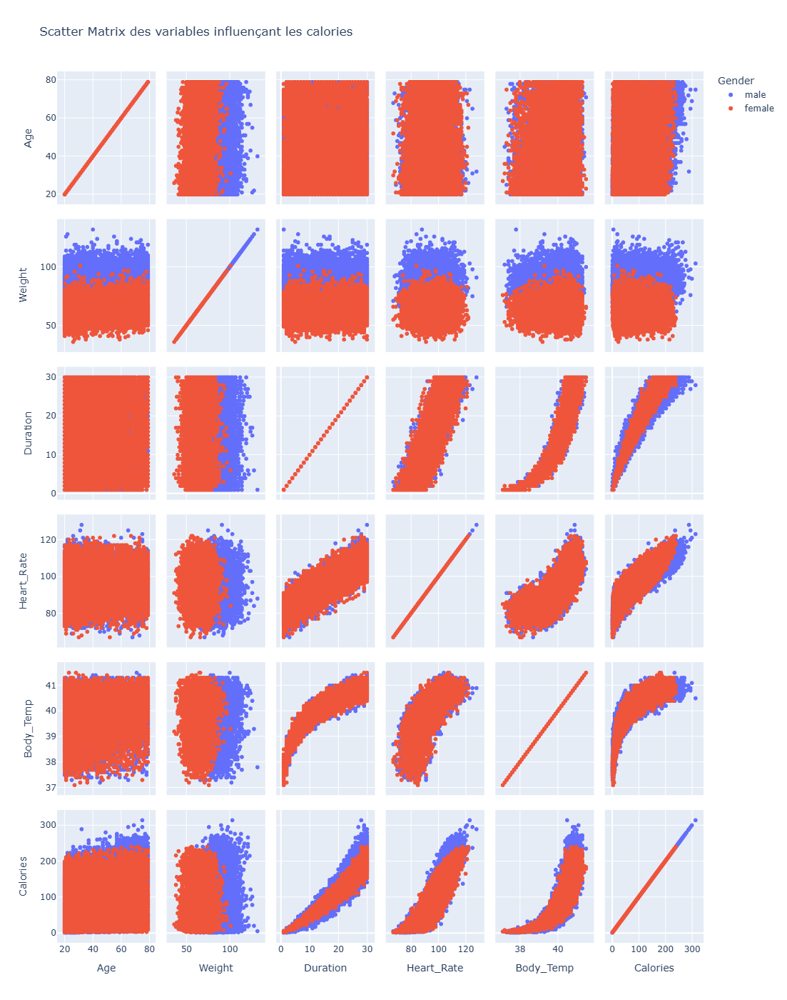

In [11]:
fig = px.scatter_matrix(
    df,
    dimensions=["Age","Weight","Duration","Heart_Rate","Body_Temp","Calories"],
    color="Gender",
    title="Scatter Matrix of Variables Influencing Calories",
    width=1400,   # width in pixels
    height=1400   # height in pixels
)

fig.show()



### **Overview**

* Each off-diagonal cell shows the relationship between two variables as a scatter plot, colored by gender.
* The diagonal cells represent the distribution of each variable.
* This visualization helps identify trends, clusters, group differences, and linear or non-linear relationships.


### **Variable-by-Variable Analysis**

#### - **Age vs Other Variables**

* The **age** distribution is concentrated between 20 and 80 years, with a similar distribution for males and females (blue and red points overlapping).
* No strong correlation is visible between age and weight, duration, or calories burned.
* The relationship between age and calories burned appears rather flat, so age is not a dominant factor here.

#### - **Weight vs Other Variables**

* Males (blue) generally have higher weight than females (red), as expected.
* Weight and calories appear positively correlated: higher weight tends to correspond to higher calories burned, though with some dispersion.
* Weight and heart rate show a weak apparent correlation.

#### - **Duration vs Other Variables**

* Duration and calories burned show a strong, non-linear positive relationship, confirming that the longer the exercise, the more calories are burned.
* Duration and heart rate also show a visible positive relationship.
* Exercise duration is spread over a wide range, with male/female overlap.

#### - **Heart_Rate vs Other Variables**

* Heart rate and calories burned show a strong positive, almost exponential relationship.
* Males tend to have slightly higher heart rates than females in this sample.
* Heart rate often increases with exercise duration and body temperature.

#### - **Body_Temp vs Other Variables**

* Body temperature varies little, around 37–40 °C, as biologically expected.
* Body temperature and calories show a positive trend, confirming that greater physical effort increases both temperature and caloric expenditure.
* Males and females have similar distributions.

#### - **Calories Burned**

* Key target variable: calories burned vary widely (0–300 kcal).
* Clear positive relationships with **Duration**, **Heart_Rate**, and to a lesser extent with **Weight** and **Body_Temp**.
* No strong relationship visible with age.


### **Male vs Female Comparison**

* Males and females differ mainly in **Weight**, and to a lesser extent in **Heart_Rate**.
* For the same duration and heart rate, males tend to burn slightly more calories (blue points slightly higher).
* Distributions of body temperature and age are very similar.


### **Summary**

* **Exercise duration** and **heart rate** are clearly the variables most correlated with calories burned, showing a strong positive relationship.
* **Weight** also affects caloric expenditure, but with more variability.
* **Age** appears to have little impact.
* Gender differences are mainly reflected in weight, which may partly explain differences in calories burned.


# 4. Data Cleaning and Preparation

* Handling of unnecessary features
* Encoding of categorical variables (One-Hot)
* Data preprocessing

In [21]:
df_encoded = pd.get_dummies(df, columns=['Gender'], drop_first=True)
df_encoded

,User_ID,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories,Gender_male
0,14733363,68,190.0,94.0,29.0,105.0,40.8,231.0,True
1,14861698,20,166.0,60.0,14.0,94.0,40.3,66.0,False
2,11179863,69,179.0,79.0,5.0,88.0,38.7,26.0,True
3,16180408,34,179.0,71.0,13.0,100.0,40.5,71.0,False
4,17771927,27,154.0,58.0,10.0,81.0,39.8,35.0,False
...,...,...,...,...,...,...,...,...,...
14995,15644082,20,193.0,86.0,11.0,92.0,40.4,45.0,False
14996,17212577,27,165.0,65.0,6.0,85.0,39.2,23.0,False
14997,17271188,43,159.0,58.0,16.0,90.0,40.1,75.0,False
14998,18643037,78,193.0,97.0,2.0,84.0,38.3,11.0,True


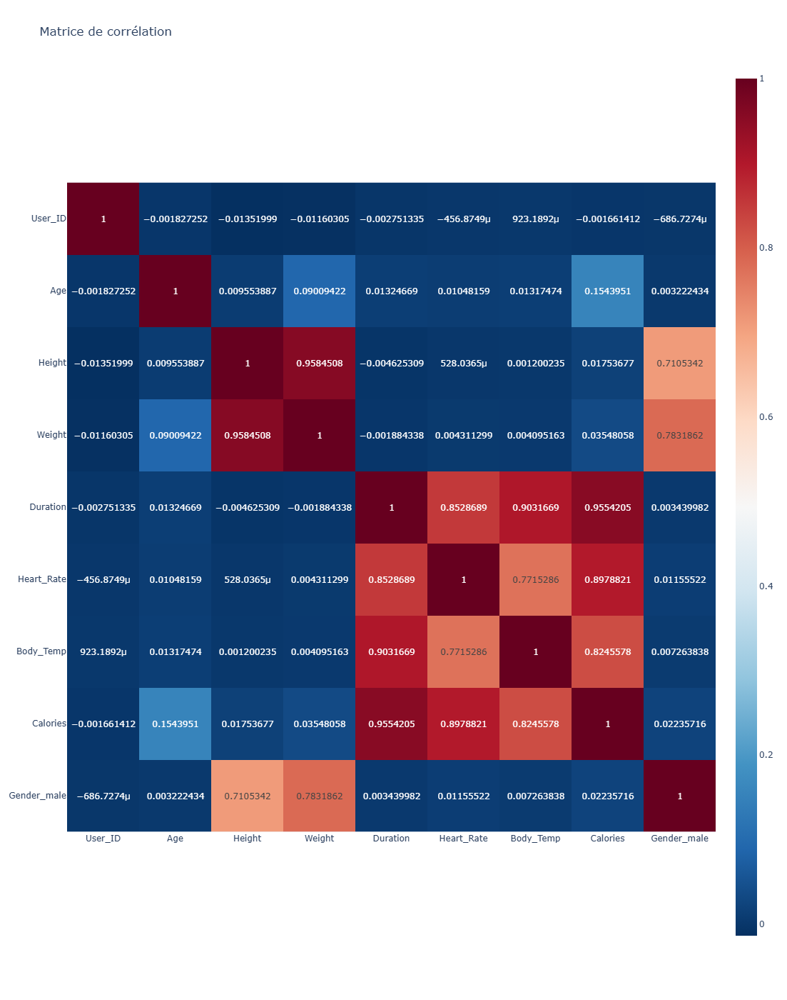

In [22]:
corr = df_encoded.corr()

fig = px.imshow(corr,
                text_auto=True,
                color_continuous_scale="RdBu_r",
                title="Matrice de corrélation",
                width=1400,   # largeur en pixels
                height=1400)   # hauteur en pixels
fig.show()


We observe a strong positive correlation between calories and body temperature, heart rate, and duration:

* Duration ↔ Heart_Rate (0.85): The longer the exercise, the higher the heart rate
* Duration ↔ Calories (0.96): Exercise duration is strongly linked to calories burned
* Heart_Rate ↔ Calories (0.90): Higher heart rate = more calories burned
* Body_Temp ↔ Calories (0.82): Physical effort increases both body temperature and calorie expenditure

There is also a strong correlation between weight, height, and gender:

* Height ↔ Weight (0.96): Expected correlation between height and weight
* Height/Weight ↔ Gender_male (0.71/0.78): Men are on average taller and heavier

Finally, we observe a weak correlation between age and calories:

* Age ↔ Calories (0.15): Slight increase in calories with age (possibly due to longer sessions)

We can therefore consider that **age does not really impact the number of calories burned**.


# 4. Model Training and Evaluation

* Define X (features) and y (label: fraudulent/non-fraudulent).  
* Train/test split for model validation (e.g., 80% train / 20% test).  
* Analysis of evaluation metrics
```


In [23]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

In [24]:
X= df_encoded.drop(columns='Calories')
y=df_encoded['Calories']

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(12000, 8) (12000,) (3000, 8) (3000,)


To limit the impact of the few extreme values (outliers) present in some numerical variables, we apply robust scaling using scikit-learn's `RobustScaler`.
This method uses the median and the interquartile range (IQR) to center and scale the data, making it more resistant to outliers compared to standard scaling.



In [26]:
from sklearn.preprocessing import RobustScaler 

scaler = RobustScaler() 
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [27]:
# Creating a dictionary to easily access different modeling models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boost " : GradientBoostingRegressor()}

=======Linear Regression=======
MAE: 8.443716322076579, MSE: 132.06758234066447, RMSE: 11.492066060576944, R²: 0.9672759152492366


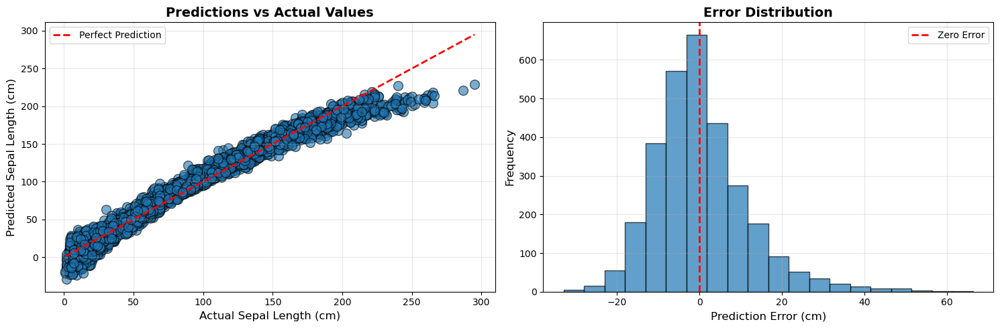

=======Random Forest=======
MAE: 1.8113333333333332, MSE: 8.038415266666666, RMSE: 2.835209915802826, R²: 0.9980082183849652


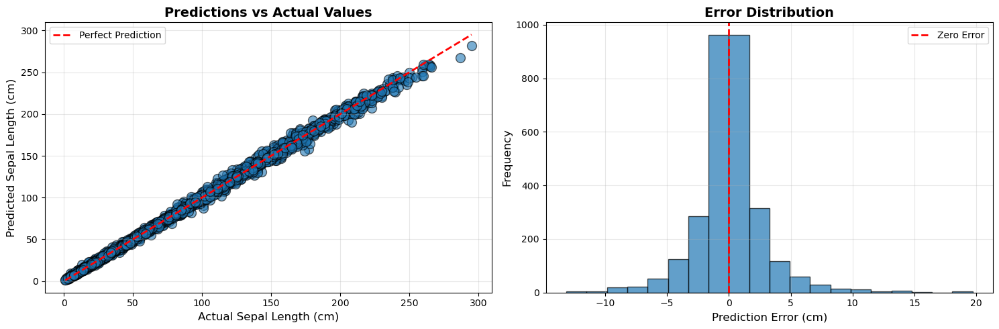

=======Gradient Boost =======
MAE: 2.606043402626666, MSE: 13.066165796131157, RMSE: 3.614715174966232, R²: 0.9967624279228706


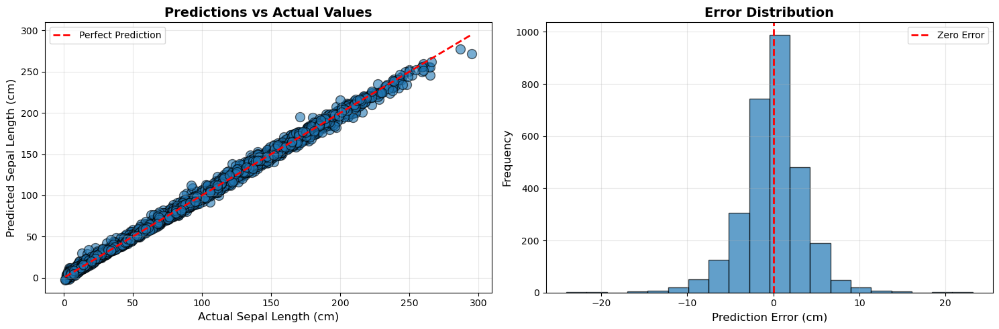

In [28]:
for name, model in models.items():
    print(f"======={name}=======")              # print the model name
    model.fit(X_train_scaled, y_train)         # train the model with training features
    y_pred = model.predict(X_test_scaled)      # predict using the test features
      
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R²: {r2}")

    # Visualization of predictions
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Plot 1: Actual vs Predicted values
    axes[0].scatter(y_test, y_pred, alpha=0.6, s=100, edgecolors='k')
    axes[0].plot([y_test.min(), y_test.max()], 
                 [y_test.min(), y_test.max()], 
                 'r--', lw=2, label='Perfect Prediction')
    axes[0].set_xlabel('Actual Sepal Length (cm)', fontsize=12)
    axes[0].set_ylabel('Predicted Sepal Length (cm)', fontsize=12)
    axes[0].set_title('Predictions vs Actual Values', fontsize=14, fontweight='bold')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Plot 2: Error distribution
    errors = y_test - y_pred
    axes[1].hist(errors, bins=20, edgecolor='black', alpha=0.7)
    axes[1].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Error')
    axes[1].set_xlabel('Prediction Error (cm)', fontsize=12)
    axes[1].set_ylabel('Frequency', fontsize=12)
    axes[1].set_title('Error Distribution', fontsize=14, fontweight='bold')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


# 5.**ANALYSIS OF CALORIE BURN PREDICTION MODELS**

## **Comparative Overview**

| Model | R² | MAE | RMSE | Performance |
|-------|-----|-----|------|-------------|
| **Linear Regression** | 0.967 | 8.44 cal | 11.49 cal | Good |
| **Random Forest** | 0.998 | 1.81 cal | 2.81 cal | **Excellent** |
| **Gradient Boosting** | 0.997 | 2.61 cal | 3.61 cal | Very Good |

---

## **MODEL 1: LINEAR REGRESSION - Acceptable Performance**

**Metrics:**

MAE : 8.44 calories → Average error of ~8 calories per session
RMSE : 11.49 calories → Standard deviation of errors
R² : 0.967 (96.7%) → Explains 96.7% of variability

**Graphical Analysis:**
- Overall alignment along the diagonal is correct
- Visible dispersion, especially for high values (>250 cal)
- Asymmetric error distribution with a right tail
- Systematic underestimation of intense sessions

**Business Impact:**
- 8 cal error/session × 5 sessions/week = **40 cal/week**
- Over 3 months: ~500 calories cumulative difference
- Sufficient for basic fitness tracking, unsuitable for precise coaching

---

## **MODEL 2: RANDOM FOREST - Absolute Champion**

**Metrics:**

MAE : 1.81 calories → Exceptionally low error
RMSE : 2.81 calories → High prediction stability
R² : 0.998 (99.8%) → Captures almost all variability

**Graphical Analysis:**
- Points extremely tight around the diagonal
- Perfect linearity across the range (0-300 cal)
- Gaussian error distribution centered on 0
- Perfect symmetry: no systematic bias

**Business Impact:**
- 1.8 cal error/session × 5 sessions/week = **9 cal/week**
- <1% error suitable for professional coaching and medical nutrition tracking
- 4.7× lower error than Linear Regression

**Use Cases:**
- Premium fitness apps
- Sports and nutrition coaching
- Medicalized weight loss programs
- Connected medical devices

---

## **MODEL 3: GRADIENT BOOSTING - Excellent Compromise**

**Metrics:**
MAE : 2.61 calories → Very low error
RMSE : 3.61 calories → Excellent stability
R² : 0.997 (99.7%) → Near-optimal performance

**Graphical Analysis:**
- Very good overall linearity
- Minimal dispersion around the diagonal
- Normal distribution well-centered on 0
- Slight positive error skew (occasional underestimation)

**Business Impact:**
- 2.6 cal error/session × 5 sessions/week = **13 cal/week**
- Excellent precision (3× lower error than Linear Regression)
- Optimal precision/complexity tradeoff for mobile deployment

**Use Cases:**
- Wearables and smartwatches
- Consumer fitness apps
- Alternative if Random Forest is too resource-intensive

---

## **COMPARISON AND RECOMMENDATIONS**

### **Ranking by Use Case:**

| Criteria | Linear Reg. | Random Forest | Gradient Boost |
|----------|-------------|---------------|----------------|
| **Precision** | 8.44 cal | **1.81 cal** | 2.61 cal |
| **Error/week** | 40 cal | **9 cal** | 13 cal |
| **Reliability** | Good | **Excellent** | Excellent |
| **Mobile deployment** | Optimal | Demanding | Good |
| **Recommended use** | Basic | **Premium/Pro** | Consumer+ |

---

### **Deployment Strategy:**

**Option A: Random Forest (Recommended Premium)**

Advantages:
- Exceptional precision: 1.81 cal (market-leading)
- No bias, maximum reliability
- Strong competitive differentiation

Target:
- Premium paid apps
- Sports and nutrition coaches
- Medical energy expenditure tracking
ROI: Justifies premium positioning and subscription


**Option B: Gradient Boosting (High-Performance Alternative)**
Advantages:
- Excellent precision: 2.61 cal (2× better than Linear Reg)
- Optimal performance/resources tradeoff
- Easier mobile deployment

Target:
- Wearables and fitness trackers
- Freemium apps
- Demanding consumer segment
ROI: Best quality/infrastructure cost ratio


**Option C: Linear Regression (Avoid in Production)**

Limitations:
- 4.7× higher error than Random Forest
- Underestimates intense sessions (visible in distribution)
- Unsuitable for precise goals (weight loss)
Acceptable use: Prototype/POC only


---

## **CONCLUSION**

Random Forest stands out as the reference model with an error of only 1.81 calories (<1%), ensuring ultra-precise energy balance for professional and medical applications.

Gradient Boosting provides a solid alternative (2.61 cal error) for mobile deployments requiring a performance/resource tradeoff.

Linear Regression, despite a respectable R² (0.967), has errors (8.44 cal) too high for demanding professional use.

**Final recommendation:** Deploy Random Forest in premium production, with Gradient Boosting as a lightweight version for wearables.

